# Investigating trees in CPH

Data from [opendata.dk](https://www.opendata.dk/city-of-copenhagen/trae_basis).

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# !pip install folium
import folium
from folium import plugins
from folium.plugins import HeatMap
import numpy as np
import pandas as pd
import urllib.request
import matplotlib.pyplot as plt
import math
from scipy import stats
from scipy.stats import ttest_ind_from_stats
import seaborn as sns
from urllib.request import urlopen
import json
import scipy.stats
import seaborn as sns
from bokeh import palettes as cp
from bokeh.plotting import figure, show, output_file, output_notebook
from bokeh.models import ColumnDataSource, Range1d, HoverTool, Legend
from bokeh.models.widgets import Tabs, Panel
from bokeh.io import show
from bokeh.palettes import Category20b, Spectral, Plasma, Viridis, YlOrRd, PuOr, BuPu, BuGn, brewer, GnBu, PRGn, Inferno256, PuRd, RdPu, PiYG, RdYlGn, YlGnBu
from bokeh.io import reset_output, output_notebook
reset_output()
output_notebook()

Loading BokehJS ...

In [31]:
df = pd.read_csv('./data/trae_basis.csv')

/var/folders/z5/w7rdzhpn7xx4g1wy_6cb0stw0000gn/T/ipykernel_49041/156968895.py:1: DtypeWarning: Columns (50,56,57,58,59,74,78,80,82,85,88,92,98,112,126,131,144,145,146,156,165,166,167,176,177,183,184,185,186,187,188,189,190) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('./data/trae_basis.csv')


In [3]:
df

,FID,kategori,saerligt_trae,id,type,element,under_element,ny_dm_element,ny_dm_under_element,arbsted_tekst_id,...,r_img15,torso_hoejde,torso_omkreds,torso_stamme,torso_sidst_stynet,torso_frekvens_styning,torso_naeste_styning,torso_skaeres_ned_til,torso_bemaerkning,wkb_geometry
0,trae_basis.1,gadetræ,nej,78391,2 Træer,2.1 Fuldkronede gade- og torvetræer,NaN,Gade- og allétræer,Gadetræ,Gadet_Gadet_3421,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (12.545926113826685 55.6691033928429)
1,trae_basis.2,parktræ,nej,31516,2 Træer,2.1 Fuldkronede gade- og torvetræer,NaN,Gade- og allétræer,Allétræ,Engha_Engha_206,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (12.541362497208743 55.66647779736041)
2,trae_basis.3,gadetræ,nej,78392,2 Træer,2.1 Fuldkronede gade- og torvetræer,NaN,Gade- og allétræer,Gadetræ,Gadet_Gadet_3421,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (12.545807913458233 55.66903694884401)
3,trae_basis.4,gadetræ,nej,85238,2 Træer,2.1 Fuldkronede gade- og torvetræer,NaN,Gade- og allétræer,Gadetræ,Gadet_Gadet_3421,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (12.54758243866618 55.66708921513664)
4,trae_basis.5,parktræ,nej,31517,2 Træer,2.1 Fuldkronede gade- og torvetræer,NaN,Gade- og allétræer,Allétræ,Engha_Engha_206,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (12.541323423761188 55.666402155654396)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62078,trae_basis.62079,parktræ,nej,54246,2 Træer,2.3 Parktræer,NaN,Park- og naturtræer,Parktræ,Veste_Skyde_151,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (12.553582278820413 55.670581625449564)
62079,trae_basis.62080,parktræ,nej,54251,2 Træer,2.3 Parktræer,NaN,Park- og naturtræer,Parktræ,Veste_Skyde_151,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (12.5535934545144 55.67064696046284)
62080,trae_basis.62081,parktræ,nej,56404,2 Træer,2.3 Parktræer,NaN,Park- og naturtræer,Parktræ,Veste_Skyde_151,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (12.553847426915283 55.66992827448404)
62081,trae_basis.62082,parktræ,nej,56405,2 Træer,2.3 Parktræer,NaN,Park- og naturtræer,Parktræ,Veste_Skyde_151,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (12.553845453188453 55.669967284017936)


## Use pandas profiler to gain insights into each column

In [4]:
# from pandas_profiling import ProfileReport

In [5]:
# profile = ProfileReport(df, title="Tree dataset", html={'style': {'full_width': True}})

In [6]:
# profile.to_notebook_iframe()

#### Findings:
1. 43.6% of trees have a planteaar of 0.

## Initial EDA on main columns to identify required cleaning, and show distribution of data

In [7]:
# function to show bar plots for categorical values
def bar_plot(column, title, width, height):
    df[column].value_counts().plot(kind='bar', title=title, color='#f1b6da',
                                edgecolor='#8e0152', linewidth=2, figsize=(width,height))
    plt.xticks(rotation = 45);

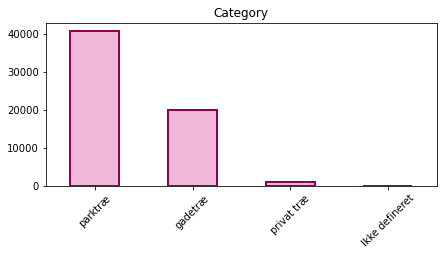

In [8]:
bar_plot('kategori', 'Category', 7, 3)

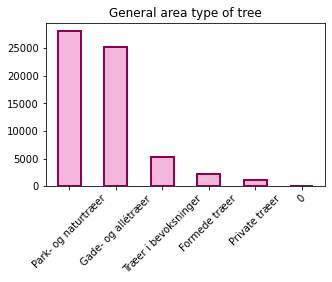

In [9]:
bar_plot('ny_dm_element', 'General area type of tree', 5, 3)

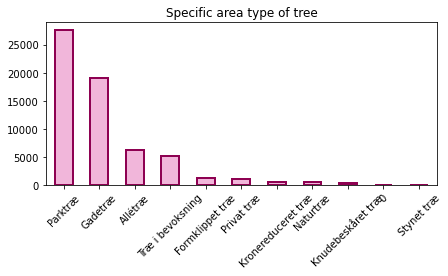

In [10]:
bar_plot('ny_dm_under_element', 'Specific area type of tree', 7, 3)

In [11]:
df.columns

Index(['FID', 'kategori', 'saerligt_trae', 'id', 'type', 'element',
       'under_element', 'ny_dm_element', 'ny_dm_under_element',
       'arbsted_tekst_id',
       ...
       'r_img15', 'torso_hoejde', 'torso_omkreds', 'torso_stamme',
       'torso_sidst_stynet', 'torso_frekvens_styning', 'torso_naeste_styning',
       'torso_skaeres_ned_til', 'torso_bemaerkning', 'wkb_geometry'],
      dtype='object', length=192)

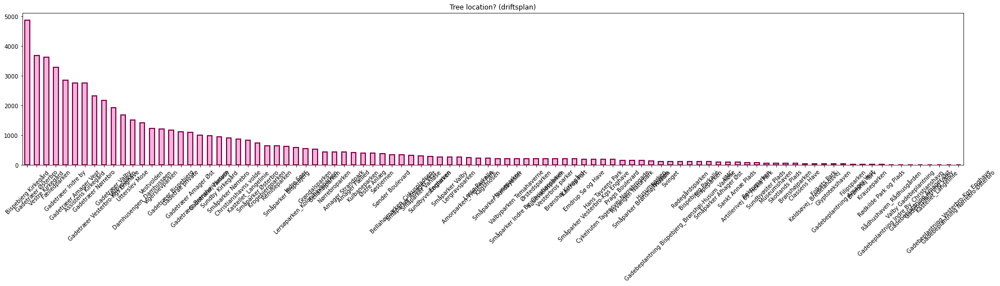

In [12]:
bar_plot('driftsplan_navn', 'Tree location? (driftsplan)', 30, 5)

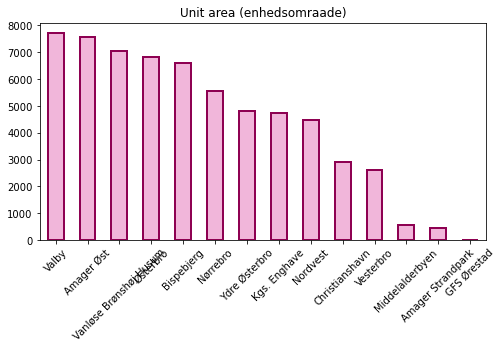

In [13]:
bar_plot('enhedsomraade', 'Unit area (enhedsomraade)', 8, 4)

In [14]:
df.dansk_navn.value_counts() # .plot(kind='bar', figsize=(20,5), title='Tree type');

Ikke registreret      25057
Kejserlind             2488
Platan                 2414
Park-Lind              2257
Almindelig robinie     1614
                      ...  
Rødstilket løn            1
Nikko-løn                 1
Dværgmispel               1
Hjortetaktræ              1
Kugle ahorn               1
Name: dansk_navn, Length: 427, dtype: int64

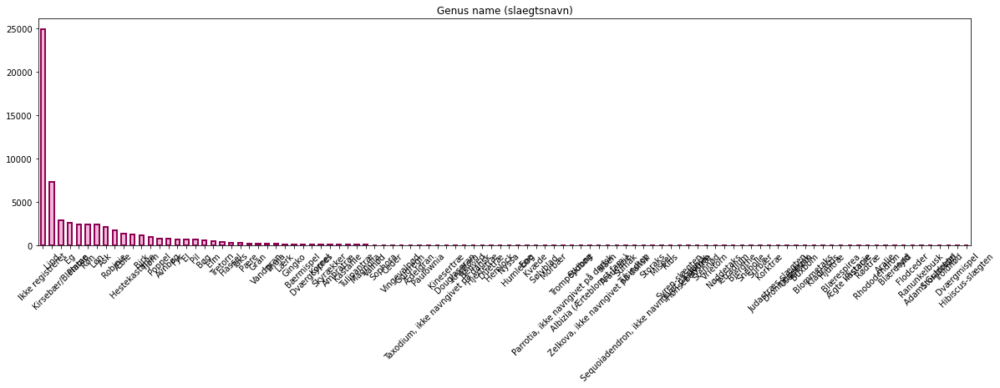

In [15]:
bar_plot('slaegtsnavn', 'Genus name (slaegtsnavn)', 20, 5)

In [16]:
# deal with NaN planteaars
df.planteaar.isna().value_counts()
df.planteaar = df.planteaar.fillna(0)
df.planteaar = df.planteaar.astype(int)

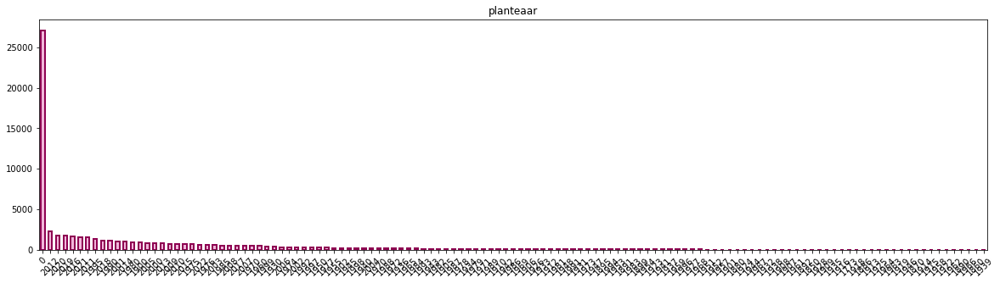

In [17]:
bar_plot('planteaar', 'planteaar', 20, 5)

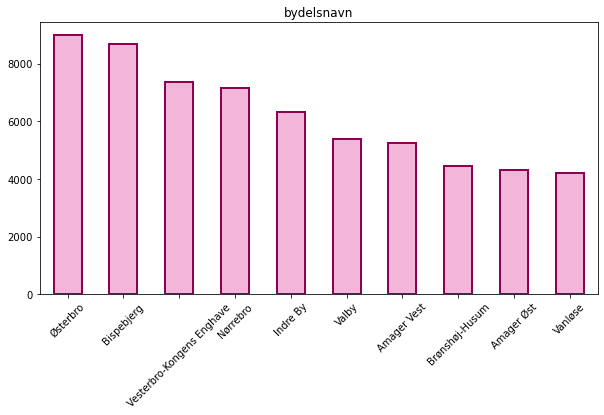

In [18]:
bar_plot('bydelsnavn', 'bydelsnavn', 10, 5)

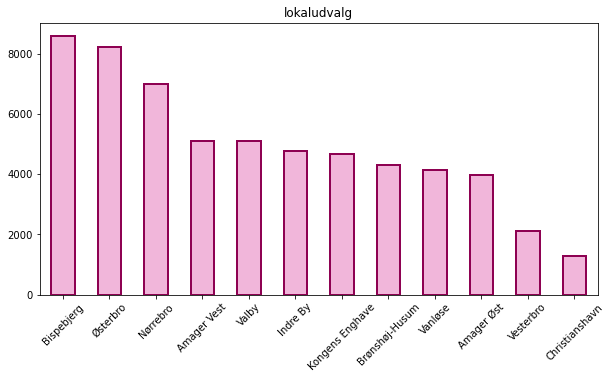

In [19]:
bar_plot('lokaludvalg', 'lokaludvalg', 10, 5)

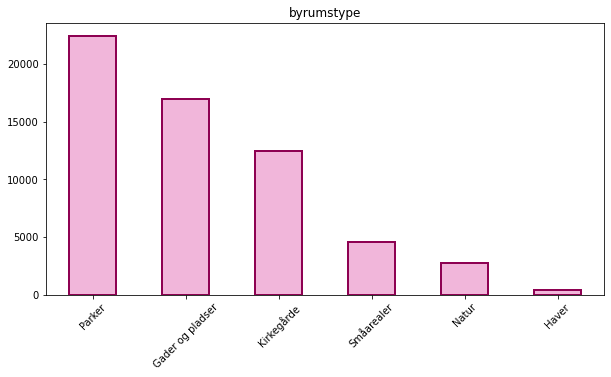

In [20]:
bar_plot('byrumstype', 'byrumstype', 10, 5)

In [21]:
# df.stednavn.value_counts().plot(kind='bar', figsize=(20,5), title='Place name (stednavn)');

df.stednavn.value_counts()

Bispebjerg Kirkegård    4880
Vestre Kirkegård        3626
Fælledparken            3308
Assistens Kirkegård     2771
Valbyparken             1900
                        ... 
Urtehaven                  1
Otto Baches Vej            1
Puggardsgade               1
Lundsgade                  1
Toftegårds Allé            1
Name: stednavn, Length: 509, dtype: int64

## Show the same plots using Bokeh

Prepare dataframes to be plotted in Bokeh 

In [22]:
# function to prepare the dataframes for Bokeh format
def prepare_df(df, col, rename_col):
    data = df[col].value_counts()
    tot = data.sum()
    data = pd.Series(data).reset_index(name='Tree count').rename(columns={'index':rename_col})
    data['percentage'] = (data['Tree count'] / tot) * 100
    return data

In [23]:
# prep the dataframes for bokeh plotting ease!
kategori_bar_df = prepare_df(df, 'kategori', 'kategori')
ny_dm_element_bar_df = prepare_df(df, 'ny_dm_element', 'ny_dm_element')
ny_dm_under_element_bar_df = prepare_df(df, 'ny_dm_under_element', 'ny_dm_under_element')
driftsplan_navn_bar_df = prepare_df(df, 'driftsplan_navn', 'driftsplan_navn') 
slaegtsnavn_bar_df = prepare_df(df, 'slaegtsnavn', 'slaegtsnavn')
planteaar_bar_df = prepare_df(df, 'planteaar', 'planteaar')
bydelsnavn_bar_df = prepare_df(df, 'bydelsnavn', 'bydelsnavn')
byrumstype_bar_df = prepare_df(df, 'byrumstype', 'byrumstype')
stednavn_bar_df = prepare_df(df, 'stednavn', 'stednavn')

In [24]:
# function to plot bokeh categorical data in a horizontal bar
def bokeh_hbar(df, column, title, xaxislabel, colorpalette, height, width):
    TOOLS = "hover,save,pan,box_zoom,reset,wheel_zoom,tap"
    p = figure(plot_height=height, plot_width=width,
        title=title, tools=TOOLS, toolbar_location='right',
        y_range=df[column].unique()[::-1]) # sort in descending order

    hbar = p.hbar(y=df[column], right=df['Tree count'],
    height=0.75, 
#     color=colorpalette[df[column].nunique()]) 
    color=colorpalette)
    p.yaxis.axis_label = xaxislabel
    p.xaxis.axis_label = 'Number of trees'
    p.select_one(HoverTool).tooltips = [(xaxislabel, '@y'), ('Number of trees', '@right')]
    
    return p

In [25]:
# ### testing with columndatasource
# source = ColumnDataSource(data=bydelsnavn_bar_df)

# TOOLS = "hover,save,pan,box_zoom,reset,wheel_zoom,tap"
# p = figure(plot_height=300, plot_width=500,
#     title='hi', tools=TOOLS, toolbar_location='right',
#     y_range=bydelsnavn_bar_df['bydelsnavn'].unique()[::-1]) # sort in descending order

# hbar = p.hbar(source = source, 
#               y='bydelsnavn', right='Tree count', height=0.75, 
#     color=Category20b[10]) 
# p.yaxis.axis_label = 'hi'
# p.xaxis.axis_label = 'Number of trees'
# p.select_one(HoverTool).tooltips = [('bydelsnavn', '@y'), ('Number of trees', '@right')]

# show(p)


## <font color=red> try to use column data source so that we can show other things in the tooltip (later on)

In [26]:
# show them all in tabs
p_kategori = bokeh_hbar(kategori_bar_df, 'kategori', "Number of trees per kategori",
                     'kategori', PuRd[4], 300, 600)
p_ny_dm_element = bokeh_hbar(ny_dm_element_bar_df, 'ny_dm_element', "Number of trees per ny_dm_element",
                     'ny_dm_element', PuRd[6], 300, 600)
p_ny_dm_under_element = bokeh_hbar(ny_dm_under_element_bar_df, 'ny_dm_under_element', "Number of trees per ny_dm_under_element",
                     'ny_dm_under_element', PuRd[6]+PuRd[5], 300, 600)
p_driftsplan_navn = bokeh_hbar(driftsplan_navn_bar_df, 'driftsplan_navn', "Number of trees per driftsplan_navn",
                     'driftsplan_navn', PuRd[9]*10+PuRd[8], 1100, 700)
p_slaegtsnavn = bokeh_hbar(slaegtsnavn_bar_df, 'slaegtsnavn', "Number of trees per slaegtsnavn",
                     'slaegtsnavn', PuRd[9]*11+PuRd[5], 1100, 700)
p_bydelsnavn = bokeh_hbar(bydelsnavn_bar_df, 'bydelsnavn', "Number of trees per bydelsnavn",
                     'bydelsnavn', PuRd[5]*2, 400, 700)
# p_kategori = bokeh_hbar(kategori_bar_df, 'kategori', "Number of trees per kategori",
#                      'kategori', PuRd, 300, 500)
# p_kategori = bokeh_hbar(kategori_bar_df, 'kategori', "Number of trees per kategori",
#                      'kategori', PuRd, 300, 500)
# p_kategori = bokeh_hbar(kategori_bar_df, 'kategori', "Number of trees per kategori",
#                      'kategori', PuRd, 300, 500)
# p_kategori = bokeh_hbar(kategori_bar_df, 'kategori', "Number of trees per kategori",
#                      'kategori', PuRd, 300, 500)
# p_kategori = bokeh_hbar(kategori_bar_df, 'kategori', "Number of trees per kategori",
#                      'kategori', PuRd, 300, 500)



# format in tabs
tabs = Tabs(tabs=[
                 Panel(child=p_kategori, title='kategori'),
                 Panel(child=p_ny_dm_element, title='ny_dm_element'),
                 Panel(child=p_ny_dm_under_element, title='ny_dm_under_element'),
                 Panel(child=p_driftsplan_navn, title='driftsplan_navn'),
                 Panel(child=p_slaegtsnavn, title='slaegtsnavn'),
                 Panel(child=p_bydelsnavn, title='bydelsnavn')
    
    
    
                    ])

show(tabs)

## <font color=red> Trending: show trees planted overtime, type of trees, location, etc.

In [27]:
# show the number of trees per year
planteaar_trending = df['planteaar'].value_counts()
planteaar_trending = pd.Series(planteaar_trending).reset_index(name='Tree count').rename(columns={'index':'planteaar'})

# sort
planteaar_trending = planteaar_trending.sort_values(by=['planteaar'], ascending=True)

# new df for the trees that have a year, and not just 0
planteaar_trending_without0 = planteaar_trending[1::]



In [28]:
# # first convert to datetime
# planteaar_trending_without0['planteaar'] = pd.to_datetime(planteaar_trending_without0['planteaar'], format ="%Y")

# planteaar_trending_without0['planteaar'] = pd.DatetimeIndex(planteaar_trending_without0['planteaar']).year

In [29]:
# show trending line graph
TOOLS = 'save,pan,box_zoom,reset,wheel_zoom,hover'
p = figure(title="Trees planted in CPH per year", y_axis_type="auto", plot_height = 350,
           tools = TOOLS, plot_width = 800, x_axis_type="auto")
p.xaxis.axis_label = 'Year'
p.yaxis.axis_label = 'Trees planted'
#p2.circle(force_count_date['Incident date'], 70, size = 10, color = 'red')
p.line(x=planteaar_trending_without0['planteaar'], y=planteaar_trending_without0['Tree count'],line_color="#6e016b", line_width = 2.5)
p.select_one(HoverTool).tooltips = [
    ('Year', '@x'),
    ('Number of trees', '@y'),
]

show(p)

## Now show grouped distribution of planteaar - 0, 1750-1800, 1800-1850, 1850-1900, 1900-1950, 1950-2000, 2000+

In [30]:
# create bins and new column for the age groups
bins = [-1, 1749, 1799, 1849, 1899, 1949, 1999, 2023]
labels = ['Not documented','[1750,1799]','[1800,1849]','[1850,1899]','[1900,1949]','[1950,1999]',
          '[2000,2022]']

tree_df['planteaar_group'] = pd.cut(tree_df['planteaar'], bins=bins, labels=labels, right=True)


NameError: name 'tree_df' is not defined

In [ ]:
# group the age together in buckets
planteaar_grouped_df = planteaar_trending.copy()
# change 'Juvenile' to be 17 (it's 14-17)
# and 'Not Documented' to be 404
# force_age_df.loc[force_age_df['subject_age']=='Juvenile']=17
# force_age_df.loc[force_age_df['subject_age']=='Not Documented']=404 # ensure Not Documented goes into its own bucket
# # change to int
planteaar_grouped_df['planteaar'] = pd.to_numeric(planteaar_grouped_df['planteaar'])

# create bins and new column for the age groups
# bins = [0, 1750, 1800, 1850, 1900, 1950, 2000, 2023]
# labels = ['Not documented','[1750,1799]','[1800,1849]','[1850,1899]','[1900,1949]','[1950,1999]',
#           '[2000,2022]']

# create bins and new column for the age groups
bins = [-1, 1749, 1799, 1849, 1899, 1949, 1999, 2023]
labels = ['Not documented','[1750,1799]','[1800,1849]','[1850,1899]','[1900,1949]','[1950,1999]',
          '[2000,2022]']

planteaar_grouped_df['planteaar_group'] = pd.cut(planteaar_grouped_df['planteaar'], bins=bins, labels=labels, right=True)

# prep for bokeh plotting
planteaar_grouped_bar_df = planteaar_grouped_df.groupby('planteaar_group')['Tree count'].sum()
planteaar_grouped_bar_df = pd.Series(planteaar_grouped_bar_df).reset_index(name='Tree count').rename(columns={'planteaar_group':'planteaar_group'})
# total = planteaar_grouped_bar_df['Tree count'].sum()
# force_age_bar_df['percentage']  = (force_age_bar_df['Incident count'] / total)  * 100

In [ ]:
TOOLS = "hover,save,pan,box_zoom,reset,wheel_zoom,tap"
p_planteaar = figure(plot_height=300, plot_width=800,
    title='Number of trees per planteaar group',
    tools=TOOLS,
    toolbar_location='right',
    y_range=planteaar_grouped_bar_df['planteaar_group'].cat.categories.values)
p_planteaar.hbar(y=planteaar_grouped_bar_df['planteaar_group'], right=planteaar_grouped_bar_df['Tree count'], 
height=0.75, color=PuRd[9][:-2]) 
p_planteaar.yaxis.axis_label = 'planteaar'
p_planteaar.xaxis.axis_label = 'Number of trees'
p_planteaar.select_one(HoverTool).tooltips = [
    ('Planteaar', '@y'),
    ('Number of trees', '@right')]
show(p_planteaar)

## Reduce columns and show more analysis

In [ ]:
columns_to_keep = ['FID', 'kategori', 'ny_dm_element', 'ny_dm_under_element','driftsplan_navn', 'slaegtsnavn','planteaar',
     'bydelsnavn','byrumstype','stednavn','wkb_geometry']

In [ ]:
tree_df = df[columns_to_keep]

In [ ]:
tree_df

,FID,kategori,ny_dm_element,ny_dm_under_element,driftsplan_navn,slaegtsnavn,planteaar,bydelsnavn,byrumstype,stednavn,wkb_geometry
0,trae_basis.1,gadetræ,Gade- og allétræer,Gadetræ,Gadetræer Vesterbro-Kgs Enghave,Eg,2016,Vesterbro-Kongens Enghave,Gader og pladser,Gade på Vesterbro,POINT (12.545926113826685 55.6691033928429)
1,trae_basis.2,parktræ,Gade- og allétræer,Allétræ,Enghaven,Ikke registreret,2000,Vesterbro-Kongens Enghave,Parker,Enghaveparken,POINT (12.541362497208743 55.66647779736041)
2,trae_basis.3,gadetræ,Gade- og allétræer,Gadetræ,Gadetræer Vesterbro-Kgs Enghave,Eg,2015,Vesterbro-Kongens Enghave,Gader og pladser,Gade på Vesterbro,POINT (12.545807913458233 55.66903694884401)
3,trae_basis.4,gadetræ,Gade- og allétræer,Gadetræ,Gadetræer Vesterbro-Kgs Enghave,Kastanie,2018,Vesterbro-Kongens Enghave,Gader og pladser,Enghave Plads,POINT (12.54758243866618 55.66708921513664)
4,trae_basis.5,parktræ,Gade- og allétræer,Allétræ,Enghaven,Ikke registreret,2000,Vesterbro-Kongens Enghave,Parker,Enghaveparken,POINT (12.541323423761188 55.666402155654396)
...,...,...,...,...,...,...,...,...,...,...,...
62078,trae_basis.62079,parktræ,Park- og naturtræer,Parktræ,Vesterbros parker,Kirsebær/Blomme,2005,Vesterbro-Kongens Enghave,Parker,Skydebanehaven,POINT (12.553582278820413 55.670581625449564)
62079,trae_basis.62080,parktræ,Park- og naturtræer,Parktræ,Vesterbros parker,Kirsebær/Blomme,2005,Vesterbro-Kongens Enghave,Parker,Skydebanehaven,POINT (12.5535934545144 55.67064696046284)
62080,trae_basis.62081,parktræ,Park- og naturtræer,Parktræ,Vesterbros parker,Ikke registreret,2011,Vesterbro-Kongens Enghave,Parker,Skydebanehaven,POINT (12.553847426915283 55.66992827448404)
62081,trae_basis.62082,parktræ,Park- og naturtræer,Parktræ,Vesterbros parker,Ikke registreret,2011,Vesterbro-Kongens Enghave,Parker,Skydebanehaven,POINT (12.553845453188453 55.669967284017936)


In [ ]:
# pull coordinates from wkb_geometry
# it is in longitide/latitude format!


In [ ]:
# How to clean?
# 0. change to string
# 1. remove "Point (" and ")"
# 2. put each value in a new column (long, lat)?

In [ ]:
tree_df.wkb_geometry = tree_df.wkb_geometry.astype(str)

/Users/alaina/opt/anaconda3/lib/python3.8/site-packages/pandas/core/generic.py:5494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [ ]:
tree_df.wkb_geometry = tree_df.wkb_geometry.str.replace("POINT \(", '')
tree_df.wkb_geometry = tree_df.wkb_geometry.str.replace("\)", '')

<ipython-input-28-b602663555ac>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  tree_df.wkb_geometry = tree_df.wkb_geometry.str.replace("POINT \(", '')
<ipython-input-28-b602663555ac>:2: FutureWarning: The default value of regex will change from True to False in a future version.
  tree_df.wkb_geometry = tree_df.wkb_geometry.str.replace("\)", '')


In [ ]:
tree_df[['lon', 'lat']] = tree_df['wkb_geometry'].str.split(' ', expand=True)

/Users/alaina/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:3191: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [ ]:
tree_df

,FID,kategori,ny_dm_element,ny_dm_under_element,driftsplan_navn,slaegtsnavn,planteaar,bydelsnavn,byrumstype,stednavn,wkb_geometry,lon,lat
0,trae_basis.1,gadetræ,Gade- og allétræer,Gadetræ,Gadetræer Vesterbro-Kgs Enghave,Eg,2016,Vesterbro-Kongens Enghave,Gader og pladser,Gade på Vesterbro,12.545926113826685 55.6691033928429,12.545926113826685,55.6691033928429
1,trae_basis.2,parktræ,Gade- og allétræer,Allétræ,Enghaven,Ikke registreret,2000,Vesterbro-Kongens Enghave,Parker,Enghaveparken,12.541362497208743 55.66647779736041,12.541362497208743,55.66647779736041
2,trae_basis.3,gadetræ,Gade- og allétræer,Gadetræ,Gadetræer Vesterbro-Kgs Enghave,Eg,2015,Vesterbro-Kongens Enghave,Gader og pladser,Gade på Vesterbro,12.545807913458233 55.66903694884401,12.545807913458233,55.66903694884401
3,trae_basis.4,gadetræ,Gade- og allétræer,Gadetræ,Gadetræer Vesterbro-Kgs Enghave,Kastanie,2018,Vesterbro-Kongens Enghave,Gader og pladser,Enghave Plads,12.54758243866618 55.66708921513664,12.54758243866618,55.66708921513664
4,trae_basis.5,parktræ,Gade- og allétræer,Allétræ,Enghaven,Ikke registreret,2000,Vesterbro-Kongens Enghave,Parker,Enghaveparken,12.541323423761188 55.666402155654396,12.541323423761188,55.666402155654396
...,...,...,...,...,...,...,...,...,...,...,...,...,...
62078,trae_basis.62079,parktræ,Park- og naturtræer,Parktræ,Vesterbros parker,Kirsebær/Blomme,2005,Vesterbro-Kongens Enghave,Parker,Skydebanehaven,12.553582278820413 55.670581625449564,12.553582278820413,55.670581625449564
62079,trae_basis.62080,parktræ,Park- og naturtræer,Parktræ,Vesterbros parker,Kirsebær/Blomme,2005,Vesterbro-Kongens Enghave,Parker,Skydebanehaven,12.5535934545144 55.67064696046284,12.5535934545144,55.67064696046284
62080,trae_basis.62081,parktræ,Park- og naturtræer,Parktræ,Vesterbros parker,Ikke registreret,2011,Vesterbro-Kongens Enghave,Parker,Skydebanehaven,12.553847426915283 55.66992827448404,12.553847426915283,55.66992827448404
62081,trae_basis.62082,parktræ,Park- og naturtræer,Parktræ,Vesterbros parker,Ikke registreret,2011,Vesterbro-Kongens Enghave,Parker,Skydebanehaven,12.553845453188453 55.669967284017936,12.553845453188453,55.669967284017936


## Point map of all trees - must reduce since it crashes haha

In [ ]:
# # set up coordinates in a list
# # X is long, Y is lat
# point_map = folium.Map(location=[55.674, 12.55], tiles="stamen toner",
#                     zoom_start = 11.5) 


# # Filter the DF for rows, then columns, then remove NaNs
# point_df = tree_df[['lat', 'lon']]
# point_df = point_df.dropna(axis=0, subset=['lat','lon'])

# # List comprehension to make out list of lists
# point_data = [[row['lat'],row['lon']] for index, row in point_df.iterrows()]

# # plot the list of points
# for point in range(0, len(point_data)):
#     folium.Marker(point_data[point]).add_to(point_map)
# point_map

## Heatmap showing location of all trees in CPH

In [ ]:
# heatmap
from folium import plugins
from folium.plugins import HeatMap


map_hooray = folium.Map(location=[55.66, 12.55], tiles="stamen toner",
                    zoom_start = 12) 

# Ensure you're handing it floats
tree_df['lat'] = tree_df['lat'].astype(float)
tree_df['lon'] = tree_df['lon'].astype(float)

# Filter the DF for rows, then columns, then remove NaNs
# heat_df = tree_df[tree_df['Speed_limit']=='40'] # Reducing data size so it runs faster
# heat_df = tree_df[tree_df['Year']=='2007'] # Reducing data size so it runs faster
heat_df = tree_df[['lat', 'lon']]
# heat_df = heat_df.dropna(axis=0, subset=['lat','lon'])

# List comprehension to make out list of lists
heat_data = [[row['lat'],row['lon']] for index, row in heat_df.iterrows()]

# Plot it on the map
HeatMap(heat_data, blur=10, radius=15).add_to(map_hooray)

# Display the map
map_hooray

<ipython-input-32-cb5841d4afe2>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tree_df['lat'] = tree_df['lat'].astype(float)
<ipython-input-32-cb5841d4afe2>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tree_df['lon'] = tree_df['lon'].astype(float)


## Heatmap showing all trees with an undocumented planting year

In [ ]:
# heatmap
map_0 = folium.Map(location=[55.675, 12.55], tiles="stamen toner",
                    zoom_start = 11.5) 

# Filter the DF for rows, then columns, then remove NaNs
heat_df = tree_df[tree_df['planteaar']==0] 
heat_df = tree_df[['lat', 'lon']]
heat_df = heat_df.dropna(axis=0, subset=['lat','lon'])

# List comprehension to make out list of lists
heat_data = [[row['lat'],row['lon']] for index, row in heat_df.iterrows()]

# Plot it on the map
HeatMap(heat_data, blur=10, radius=15).add_to(map_0)

# Display the map
map_0

## Heatmap showing all trees with a documented planting year

In [ ]:
# heatmap
map = folium.Map(location=[55.675, 12.55], tiles="stamen toner",
                    zoom_start = 11.5) 

# Filter the DF for rows, then columns, then remove NaNs
heat_df = tree_df[tree_df['planteaar']!=0] 
heat_df = tree_df[['lat', 'lon']]
heat_df = heat_df.dropna(axis=0, subset=['lat','lon'])

# List comprehension to make out list of lists
heat_data = [[row['lat'],row['lon']] for index, row in heat_df.iterrows()]

# Plot it on the map
HeatMap(heat_data, blur=10, radius=15).add_to(map)

# Display the map
map

## Heatmap video showing location of trees planted from 2000-2021

In [ ]:
# heat map video over year
from folium import plugins

map_hm = folium.Map(location=[55.674, 12.55], tiles="stamen toner",
                    zoom_start = 11.5) 


# List comprehension to make out list of lists
# heat_data = [[row['Y'],row['X']] for index, row in heat_df.iterrows()]
# Create weight column, using date
heat_df['Weight'] = tree_df['planteaar']
# heat_df['Weight'] = heat_df['Weight'].astype(float)
heat_df = heat_df.dropna(axis=0, subset=['lat','lon', 'Weight'])

# List comprehension to make out list of lists
heat_data = [[[row['lat'],row['lon']] for index, row in heat_df[heat_df['Weight'] == i].iterrows()] for i in range(2000,2022)]

# Plot it on the map
hm = plugins.HeatMapWithTime(heat_data,auto_play=True,max_opacity=0.8,
                            index=[2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, \
                           2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021])
#                              ,index=np.arange(2000,2022))
hm.add_to(map_hm)
# Display the map
map_hm

# Function to input a tree type and see where it's located across CPH!

In [ ]:
# input a tree type and return a heat map
def find_tree_in_cph(slaegtsnavn):
    temp_df = tree_df.loc[tree_df['slaegtsnavn'] == slaegtsnavn]
    # heatmap
    map = folium.Map(location=[55.674, 12.55], tiles="stamen toner",
                    zoom_start = 11.5) 

    # Filter the DF for rows, then columns, then remove NaNs
    heat_df = temp_df[['lat', 'lon']]
    heat_df = heat_df.dropna(axis=0, subset=['lat','lon'])

    # List comprehension to make out list of lists
    heat_data = [[row['lat'],row['lon']] for index, row in heat_df.iterrows()]

    # Plot it on the map
    HeatMap(heat_data, blur=10, radius=15).add_to(map)

    # Display the map
    return map

In [ ]:
find_tree_in_cph('Guldregn')

In [ ]:
find_tree_in_cph("Kirsebær/Blomme")

In [ ]:
# Poppels line the big street in Assistent Kirkegård
find_tree_in_cph("Poppel")

In [ ]:
# There are a lot on Tomsgårdsvej
find_tree_in_cph("Gingko")

In [ ]:
# find Magnolia trees
find_tree_in_cph("Magnolia")

In [ ]:
# apple
find_tree_in_cph('Æble')

# Other ideas:
Matrix plots to see which types of trees are in which area?

In [ ]:
# create the function with various parameters to produce a heatmap
def create_heatmap(column1, column2, cmap, figsize, title, ylabel, xlabel, normalize, fmt, xtickrot):
    '''for normalize, choose False, 'columns', 'index', or True
       if False, fmt should be "d". if 'columns', fmt should be ".1%"'''
    hm = pd.crosstab(column1, column2, normalize=normalize)
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(hm, cmap=cmap, linewidth=0.1, linecolor='black', cbar_kws={"shrink": .8}, annot=True,fmt=fmt)
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)
    plt.xticks(rotation = xtickrot)
    plt.title(title)
    plt.show()

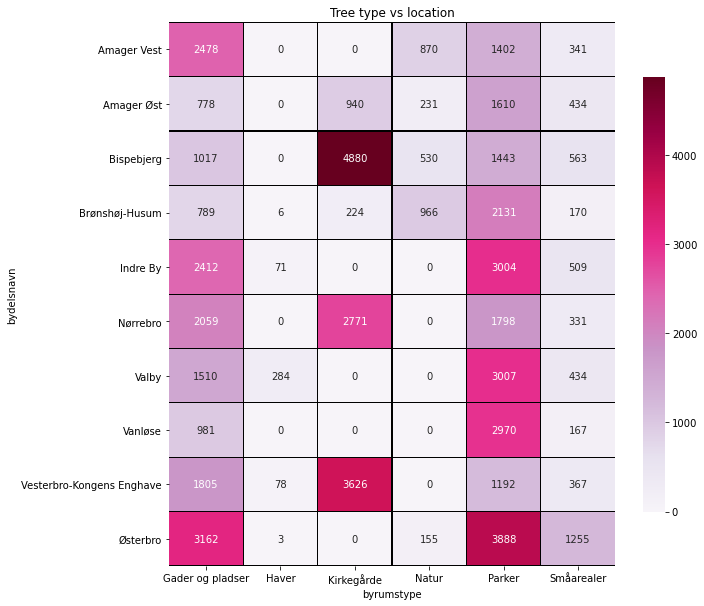

In [ ]:
create_heatmap(tree_df['bydelsnavn'],tree_df['byrumstype'], "PuRd", (10,10), 'Tree type vs location', 
                'bydelsnavn', 'byrumstype', False, "d", None)

In [ ]:
# get one row per year and counts of driftsplan_navn in order to do trending by year.
df_yearly_counts = tree_df.groupby('planteaar').sum().reset_index()

# # remove the 0 for now
# df_yearly_counts_without0 = df_yearly_counts[1:]

In [ ]:
# prep the df to be one row per year with the category counts in each column
stacked_year_bydelsnavn = tree_df.groupby(['planteaar_group', 'bydelsnavn']).size().unstack().reset_index()
# find each bias type
types = tree_df['bydelsnavn'].unique()
# add total count for hover tool
# stacked_year['Total hate crimes'] = type_stacked_year.drop("Report Year", axis=1).sum(axis=1)

# replace NaNs with 0s
# type_stacked_year = type_stacked_year.fillna(0)

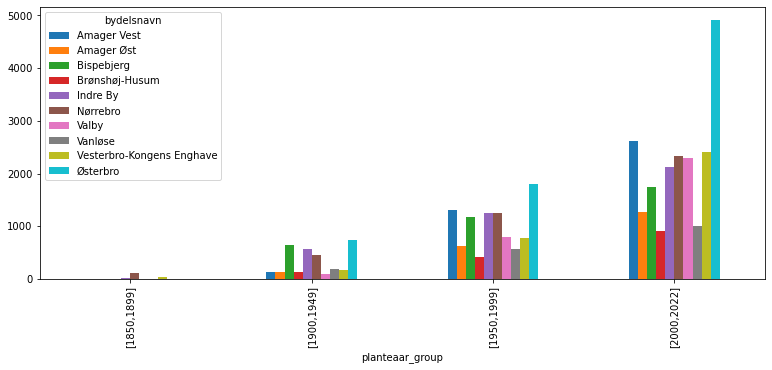

In [ ]:
# start from 1850 since the previous don't have data
stacked_year_bydelsnavn[3:].plot(x='planteaar_group', kind='bar', figsize=(13,5));

In [ ]:
# create_heatmap(tree_df['driftsplan_navn'],tree_df['planteaar'], "PuRd", (10,30), 'Tree location vs year', 
#                 'driftsplan_navn', 'planteaar', False, "d", None)

# Analyze Bispebjerg cemetary

In [ ]:
bk = tree_df.loc[tree_df.driftsplan_navn == 'Bispebjerg Kirkegård']
bk.head()

,FID,kategori,ny_dm_element,ny_dm_under_element,driftsplan_navn,slaegtsnavn,planteaar,bydelsnavn,byrumstype,stednavn,wkb_geometry,lon,lat
117,trae_basis.115,parktræ,Park- og naturtræer,Parktræ,Bispebjerg Kirkegård,Fyr,0,Bispebjerg,Kirkegårde,Bispebjerg Kirkegård,12.528990106633621 55.718220141842814,12.528990,55.718220
118,trae_basis.116,parktræ,Park- og naturtræer,Parktræ,Bispebjerg Kirkegård,Dværgcypres,0,Bispebjerg,Kirkegårde,Bispebjerg Kirkegård,12.5289123912437 55.71828756474505,12.528912,55.718288
121,trae_basis.119,parktræ,Park- og naturtræer,Parktræ,Bispebjerg Kirkegård,Hassel,0,Bispebjerg,Kirkegårde,Bispebjerg Kirkegård,12.52899517869619 55.71843329121828,12.528995,55.718433
149,trae_basis.147,parktræ,Park- og naturtræer,Parktræ,Bispebjerg Kirkegård,Dværgcypres,0,Bispebjerg,Kirkegårde,Bispebjerg Kirkegård,12.529020896617121 55.718548113608925,12.529021,55.718548
441,trae_basis.437,parktræ,Park- og naturtræer,Parktræ,Bispebjerg Kirkegård,Ikke registreret,0,Bispebjerg,Kirkegårde,Bispebjerg Kirkegård,12.52984812641453 55.71409589262359,12.529848,55.714096


In [ ]:
tree_df.loc[tree_df['bydelsnavn']=='Nørrebro'].slaegtsnavn.value_counts().to_frame().head(10)

,slaegtsnavn
Ikke registreret,2986
Lind,952
Robinie,280
Løn,267
Kirsebær/Blomme,253
Æble,225
Eg,208
Hestekastanie,192
Ask,181
Platan,171


# Function to input desired tree type, and see heatmap for it within the cemetary.

In [ ]:
# function to input a tree type that we want to see the location of in bispebjerg cemetary
def find_tree_in_cemetary(slaegtsnavn):
    df = bk.loc[bk['slaegtsnavn'] == slaegtsnavn]
    # heatmap
    map = folium.Map(location=[55.714, 12.528], tiles="stamen toner",
                        zoom_start = 16) 

    # Filter the DF for rows, then columns, then remove NaNs
    heat_df = df[['lat', 'lon']]
    heat_df = heat_df.dropna(axis=0, subset=['lat','lon'])

    # List comprehension to make out list of lists
    heat_data = [[row['lat'],row['lon']] for index, row in heat_df.iterrows()]

    # Plot it on the map
    HeatMap(heat_data, blur=10, radius=15).add_to(map)

    # Display the map
    return map

In [ ]:
# Kirsebær/Blomme
find_tree_in_cemetary("Kirsebær/Blomme")

In [ ]:
# guldregn
find_tree_in_cemetary('Guldregn')

In [ ]:
# taks
find_tree_in_cemetary('Taks')

## Heatmap video of all trees, starting from 0

In [ ]:
# retrieve all years that a tree was planted in BK
bk_aar_list = bk['planteaar'].tolist()
bk_aar_list = list(dict.fromkeys(bk_aar_list))
bk_aar_list.sort()

In [ ]:
# heat map video over year
from folium import plugins

map_bk = folium.Map(location=[55.714, 12.528], tiles="stamen toner",
                    zoom_start = 16) 


# List comprehension to make out list of lists
# heat_data = [[row['Y'],row['X']] for index, row in heat_df.iterrows()]
# Create weight column, using date
heat_df['Weight'] = bk['planteaar']
# heat_df['Weight'] = heat_df['Weight'].astype(float)
heat_df = heat_df.dropna(axis=0, subset=['lat','lon', 'Weight'])

# List comprehension to make out list of lists
heat_data = [[[row['lat'],row['lon']] for index, row in heat_df[heat_df['Weight'] == i].iterrows()] for i in bk_aar_list]  #range(2000,2022)]

# Plot it on the map
hm = plugins.HeatMapWithTime(heat_data,auto_play=True,max_opacity=0.8,
                            index=bk_aar_list)

hm.add_to(map_bk)
# Display the map
map_bk

## Show all coordinates - jk it's so slow

In [ ]:
# # set up coordinates in a list
# # X is long, Y is lat
# point_map = folium.Map(location=[55.674, 12.55], tiles="stamen toner",
#                     zoom_start = 11.5) 


# # Filter the DF for rows, then columns, then remove NaNs
# point_df = bk[['lat', 'lon']]
# point_df = point_df.dropna(axis=0, subset=['lat','lon'])

# # List comprehension to make out list of lists
# point_data = [[row['lat'],row['lon']] for index, row in point_df.iterrows()]

# # plot the list of points
# for point in range(0, len(point_data)):
#     folium.Marker(point_data[point]).add_to(point_map)
# point_map

## other ideas????

biggest tree?

In [ ]:
df.enhedsomraade.value_counts()

Valby                     7723
Amager Øst                7581
Vanløse Brønshøj Husum    7043
Østerbro                  6826
Bispebjerg                6617
Nørrebro                  5546
Ydre Østerbro             4800
Kgs. Enghave              4739
Nordvest                  4485
Christianshavn            2892
Vesterbro                 2611
Middelalderbyen            569
Amager Strandpark          441
GFS Ørestad                  5
Name: enhedsomraade, dtype: int64

In [ ]:
tree_df.loc[tree_df['planteaar']==0].bydelsnavn.value_counts()

Bispebjerg                   5103
Vesterbro-Kongens Enghave    3956
Nørrebro                     3025
Brønshøj-Husum               3001
Vanløse                      2453
Indre By                     2360
Amager Øst                   2284
Valby                        2192
Østerbro                     1542
Amager Vest                  1172
Name: bydelsnavn, dtype: int64